In [25]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
import os, pickle
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import numpy as np
import sys
sys.path.append("/home/cctrotte/krauthammer/eustar_clean/benchmark_VAE/")
sys.path.append("/home/cctrotte/krauthammer/eustar_clean/benchmark_VAE/src/")

In [26]:
import pickle
import copy
from pythae.ssc.body import Body
from pythae.trainers import BaseTrainerConfig
from pythae.pipelines.training import TrainingPipeline
from pythae.models.beta_vae_gp.classifier_config import ClassifierConfig, PredictorConfig, EncoderDecoderConfig, PriorLatentConfig, DecoderConfig
from pythae.models import BetaVAEgpCondInd
from pythae.models import BetaVAEgpCondIndConfig
from pythae.models.beta_vae_gp.GP import predict_D, predict_D2
from pythae.models.beta_vae_gp.encoder_decoder import LSTM_Encoder, LSTM_Retrodiction_Encoder, LSTM_Retrodiction_Decoder, LSTM_Decoder, Guidance_Classifier, Indep_MLP_Decoder, MLP_Predictor, MLP_Decoder, LSTM_Predictor
from pythae.models.beta_vae_gp.prior_latent import PriorLatent
import imageio as iio
from pythae.models import AutoModel
from pythae.ssc.plots import *
import random
from pythae.models.beta_vae_gp.classifier_config import ClassifierConfig
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pythae.ssc.results import EvalPatient, EvaluationDataset
from pythae.ssc.utils import load_cv, get_classifier_config, remove_short_samples

In [27]:
data_path = "/home/cctrotte/krauthammer/eustar_clean/fake_data/processed/"
figure_path = "/home/cctrotte/krauthammer/eustar_clean/demo_notebooks/plots/"
name = "_ml4h"
with open(data_path + "bodies_" + name + ".pkl", "rb") as file:
    bodies = pickle.load(file)
with open(data_path + "cohorts_" + name + ".pkl", "rb") as file:
    cohorts = pickle.load(file)

In [28]:
len(data_valid_folds[3])

12

In [29]:
# variables info
var_weights0 = [var.class_weight_norm for var in (bodies[0].variables + bodies[0].labels)]
(
    data_train_folds,
    data_valid_folds,
    data_test_folds,
    varNames,
    varSplits,
    xyt0,
    xyt1,
) = load_cv(data_path, name=name)
var_names0 = [var.name for var in (bodies[0].variables+ bodies[0].labels)]

names_x0 = [vN for i,vN in enumerate(var_names0) if xyt0[i]=='x']
names_y0 = [vN for i,vN in enumerate(var_names0) if xyt0[i]=='y']
names_s0 = [vN for i,vN in enumerate(var_names0) if xyt0[i]=='s']

kinds_x0 = [ var.kind for var in (bodies[0].variables+ bodies[0].labels) for nx in names_x0 if var.name==nx ]
kinds_y0 = [ var.kind for var in (bodies[0].variables+ bodies[0].labels) for nx in names_y0 if var.name==nx ]
splits_x0 = [vN for i,vN in enumerate(varSplits) if xyt0[i]=='x']
splits_y0 = [vN for i,vN in enumerate(varSplits) if xyt0[i]=='y']
splits_s0 = [vN for i, vN in enumerate(varSplits) if xyt0[i] == "s"]

names_x1 = [vN for i,vN in enumerate(varNames) if xyt1[i]=='x']
kinds_x1 = [item  for i,spl in enumerate(splits_x0) for item in [kinds_x0[i]]*spl ]

In [30]:
# remove samples of length 0 or 1
for i, (data_train, data_valid, data_test) in enumerate(
        zip(data_train_folds, data_valid_folds, data_test_folds)
    ):
        data_train, data_valid, data_test = remove_short_samples(
            data_train, data_valid, data_test
        )

        data_train_folds[i] = data_train
        data_valid_folds[i] = data_valid
        data_test_folds[i] = data_test

In [31]:
model_path = '/home/cctrotte/krauthammer/eustar_clean/demo_notebooks/saved_models/model_fold_0/model/final_model'
model = AutoModel.load_from_folder(model_path)

In [32]:
# move to cpu
model.cpu();
model.device = "cpu"
model.classifiers = [classif.cpu() for classif in model.classifiers]
model.encoder.device = "cpu"
model.decoder.device = "cpu"
fold = 0
data_train = data_train_folds[fold]
data_valid = data_valid_folds[fold]
data_test = data_test_folds[fold]
body = bodies[fold]

In [33]:
random.choice(range(len(data_test)))

189

In [34]:
eval_p = EvalPatient(data_test, model, body, splits_x0, names_x0, kinds_x0, splits_y0, names_y0, kinds_y0, names_s0, kinds_x1, names_x1, 1, batch_num = random.choice(range(len(data_test))))

In [35]:
eval_p.evaluate()

Forced Vital Capacity (FVC - % predicted)
DLCO/SB (% predicted)


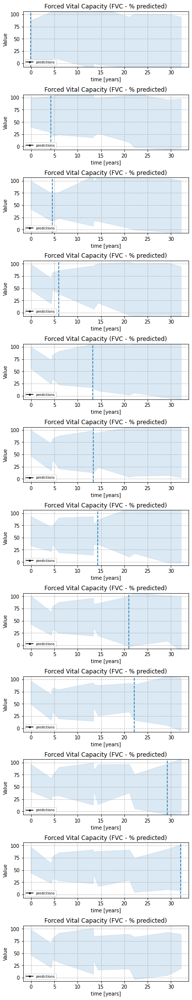

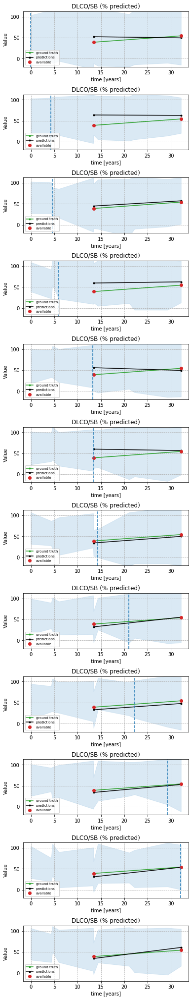

In [36]:
names_cont = [
    elem
    for index, elem in enumerate(names_x1)
    if kinds_x1[index] in ["continuous", "ordinal"]
]
for name in names_cont[:2]:
    print(name)
    eval_p.plot_continuous_feature(name, figure_path)

In [37]:
names_cat_x = [
    elem
    for index, elem in enumerate(names_x0)
    if kinds_x0[index] not in ["continuous", "ordinal"]
]
names_cat_x

['Lung fibrosis/ %involvement',
 'Dyspnea (NYHA-stage)',
 'Worsening of cardiopulmonary manifestations within the last month',
 'HRCT: Lung fibrosis',
 'Ground glass opacification',
 'Honey combing',
 'Tractions',
 'Any reticular changes',
 'Diastolic function abnormal',
 'Ventricular arrhythmias',
 'Arrhythmias requiring therapy',
 'Pericardial effusion on echo',
 'Conduction blocks',
 'Auricular Arrhythmias',
 'Cardiac arrhythmias',
 'Joint synovitis',
 'Joint polyarthritis',
 'Tendon friction rubs']

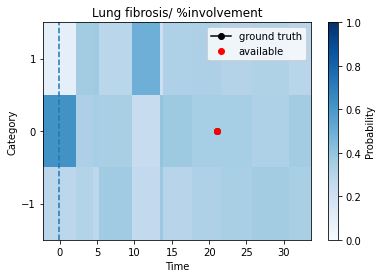

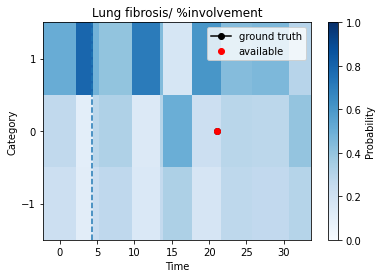

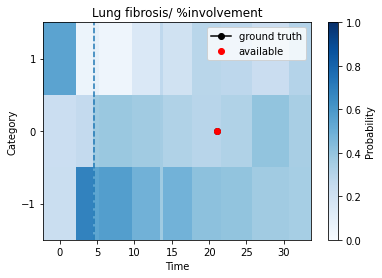

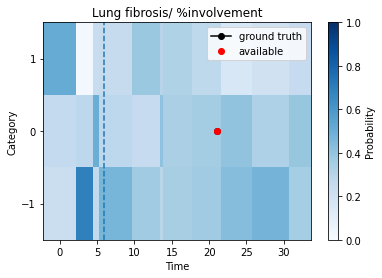

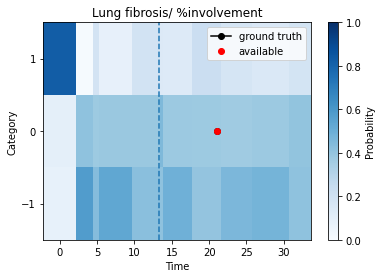

...

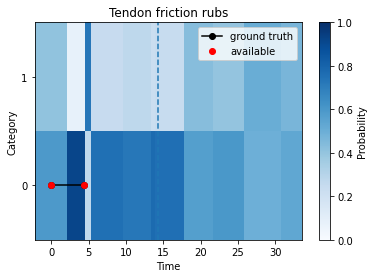

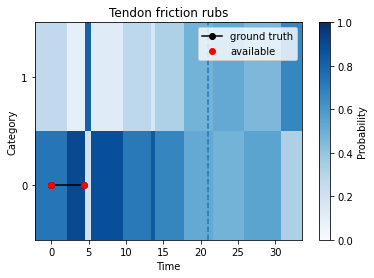

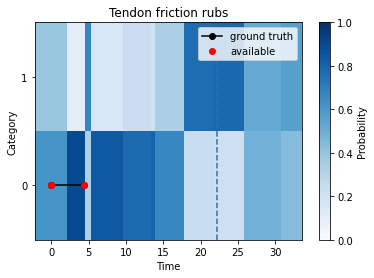

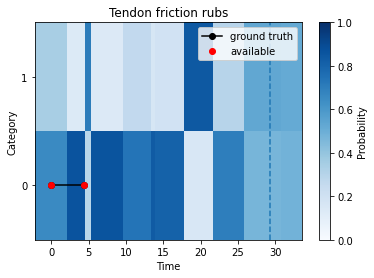

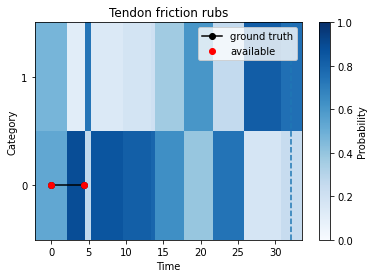

In [38]:
eval_p.plot_categorical_x(figure_path)

In [39]:
len(data_test)

249

In [40]:
len(data_train)

1126

In [41]:
evaluation = EvaluationDataset(data_test, model, body, splits_x0, names_x0, kinds_x0, splits_y0, names_y0, kinds_y0, names_s0, kinds_x1, names_x1, len(data_test))
evaluation.evaluate(num_samples = 10)

13667
Forced Vital Capacity (FVC - % predicted)
DLCO/SB (% predicted)
DLCOc/VA (% predicted)
Lung fibrosis/ %involvement
acc 0.8199004975124378
acc naive 0.34228855721393037
Dyspnea (NYHA-stage)
acc 0.9909584086799277
acc naive 0.2603978300180832
Worsening of cardiopulmonary manifestations within the last month
acc 0.5481778875849289
acc naive 0.49830142063001853
HRCT: Lung fibrosis
acc 0.8743509865005192
acc naive 0.4963655244029076
Ground glass opacification
acc 0.6488222698072805
acc naive 0.5010706638115632
Honey combing
acc 0.5243181384703414
acc naive 0.49723440778180433
Tractions
acc 0.5125140924464487
acc naive 0.5138669673055243
Any reticular changes
acc 0.5203948593779102
acc naive 0.4956230210467499
Left ventricular ejection fraction (%)
Diastolic function abnormal
acc 0.5445173383317713
acc naive 0.49531396438612935
Ventricular arrhythmias
acc 0.5234015548151674
acc naive 0.5026178010471204
Arrhythmias requiring therapy
acc 0.500852052672347
acc naive 0.5005422153369481
Per

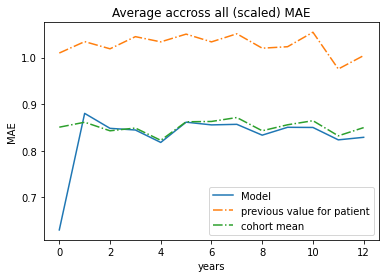

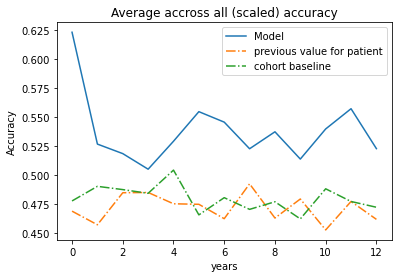

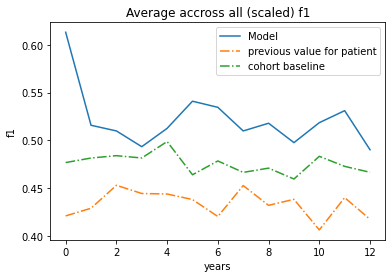

In [42]:
evaluation.get_patient_specific_baseline_x()
evaluation.get_result_df_x()

(0, 0)
LUNG_ILD_involvement_or
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     12394
         1.0       0.96      0.25      0.40      1522

    accuracy                           0.92     13916
   macro avg       0.94      0.63      0.68     13916
weighted avg       0.92      0.92      0.89     13916

              precision    recall  f1-score   support

         0.0       0.89      0.58      0.70     12394
         1.0       0.11      0.41      0.17      1522

    accuracy                           0.56     13916
   macro avg       0.50      0.50      0.44     13916
weighted avg       0.80      0.56      0.65     13916

[[12378    16]
 [ 1136   386]]
LUNG_ILD_stage_or
              precision    recall  f1-score   support

         1.0       0.78      0.93      0.85       536
         2.0       0.78      0.85      0.82       918
         3.0       0.91      0.57      0.70       709
         4.0       0.84      0.91      0.88      

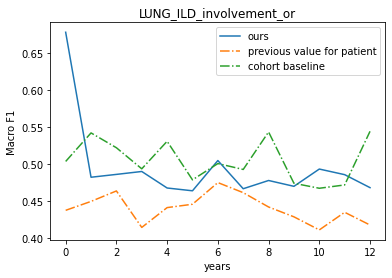

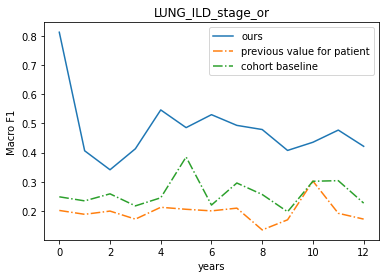

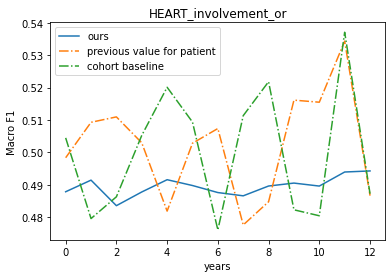

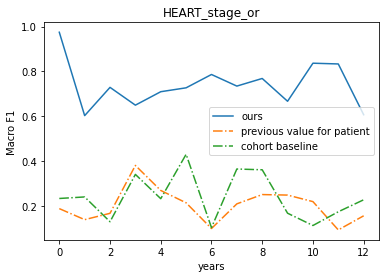

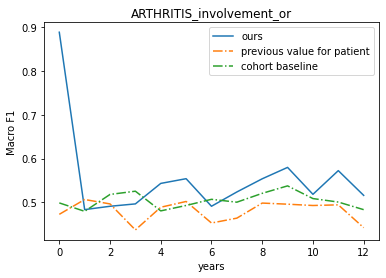

...

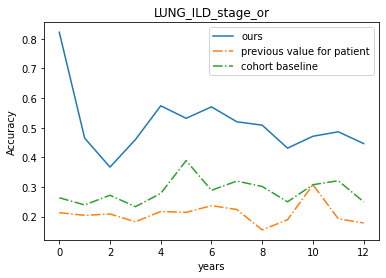

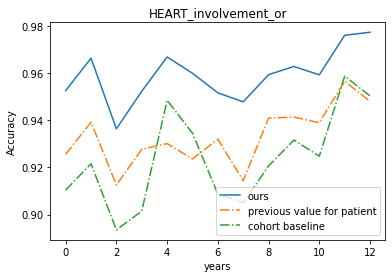

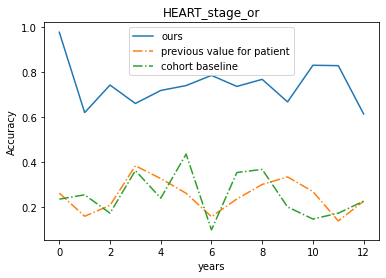

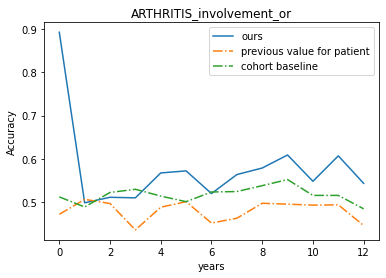

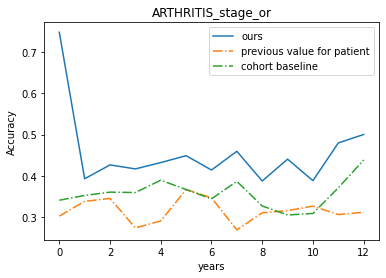

In [43]:
evaluation.get_patient_specific_baseline_y()
evaluation.get_result_df_y()

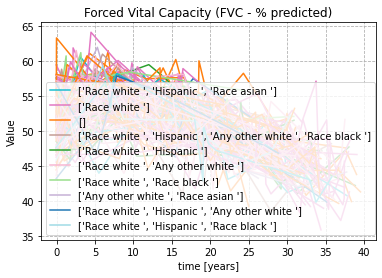

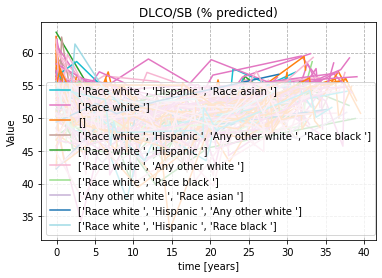

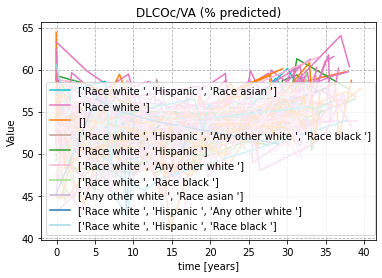

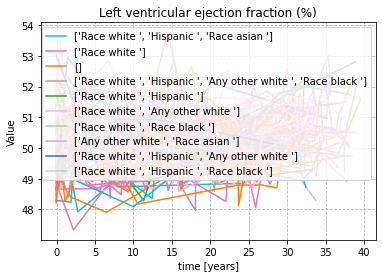

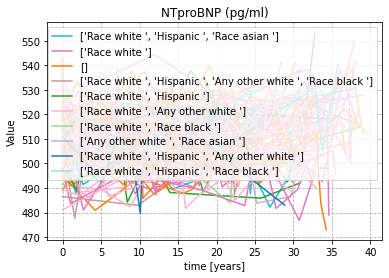

...

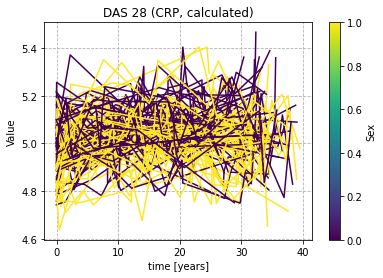

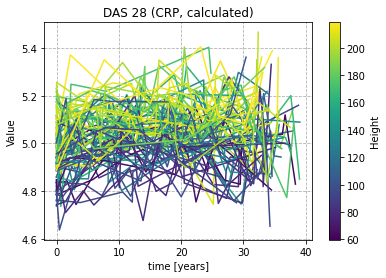

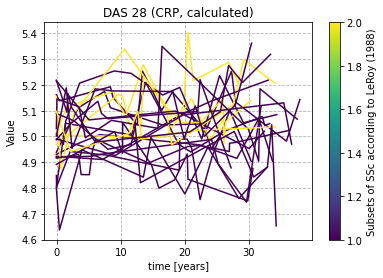

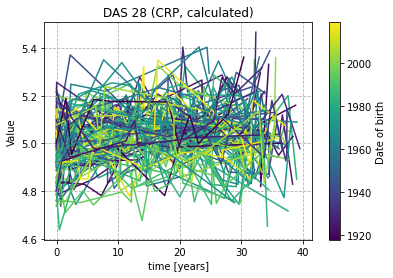

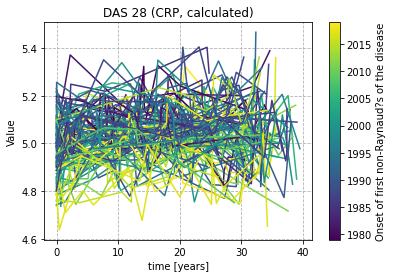

In [44]:
evaluation.plot_prior_preds()

In [46]:
from openTSNE import TSNE

In [47]:
tsne = TSNE(
    perplexity=70,
    metric="euclidean",
    n_jobs=8,
    random_state=42,
    verbose=True,
)

In [48]:
# fit on train
sample_batch_train = data_train.get_ith_sample_batch_with_customDataLoader(0,1400)
out_train = model(sample_batch_train)

In [49]:
splits_train = sample_batch_train["splits"]
indices_recon_train = torch.cat([torch.cat([torch.cat([torch.full((index, 1), True), torch.full((splits_train[pat] - index,1), False)], dim=0) for index in range(0, splits_train[pat] + 1)]) for pat in range(len(splits_train))]).flatten()
# fit only on reconstruction indices
z_tsne_train = tsne.fit(out_train.z[indices_recon_train].detach())

--------------------------------------------------------------------------------
TSNE(early_exaggeration=12, n_jobs=8, perplexity=70, random_state=42,
     verbose=True)
--------------------------------------------------------------------------------
===> Finding 210 nearest neighbors using Annoy approximate search using euclidean distance...
   --> Time elapsed: 12.55 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 1.16 seconds
===> Calculating PCA-based initialization...
   --> Time elapsed: 0.33 seconds
===> Running optimization with exaggeration=12.00, lr=5218.17 for 250 iterations...
Iteration   50, KL divergence 5.8821, 50 iterations in 3.0778 sec
Iteration  100, KL divergence 5.9098, 50 iterations in 2.3489 sec
Iteration  150, KL divergence 5.9106, 50 iterations in 2.2834 sec
Iteration  200, KL divergence 5.9107, 50 iterations in 2.3270 sec
Iteration  250, KL divergence 5.9107, 50 iterations in 2.3272 sec
   --> Time elapsed: 12.37 seconds
===> Running optimizat

In [50]:
z_tsne_test = z_tsne_train.transform(evaluation.predictions.z[evaluation.indices_recon].detach())


===> Finding 15 nearest neighbors in existing embedding using Annoy approximate search...
   --> Time elapsed: 7.99 seconds
===> Calculating affinity matrix...
   --> Time elapsed: 0.02 seconds
===> Running optimization with exaggeration=4.00, lr=0.10 for 0 iterations...
   --> Time elapsed: 0.00 seconds
===> Running optimization with exaggeration=1.50, lr=0.10 for 250 iterations...
Iteration   50, KL divergence 214431.4782, 50 iterations in 0.2423 sec
Iteration  100, KL divergence 212905.0387, 50 iterations in 0.2731 sec
Iteration  150, KL divergence 211913.4852, 50 iterations in 0.2775 sec
Iteration  200, KL divergence 211194.1807, 50 iterations in 0.3006 sec
Iteration  250, KL divergence 210642.3022, 50 iterations in 0.3072 sec
   --> Time elapsed: 1.40 seconds


In [51]:
list_of_arrays_recon = np.split(evaluation.non_missing_y_recon[evaluation.indices_recon], np.cumsum(evaluation.splits_y0[:-1]), axis=1)


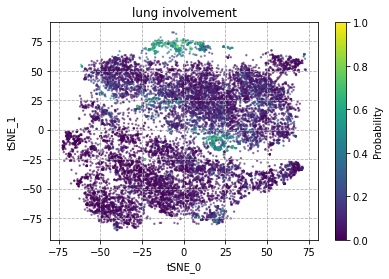

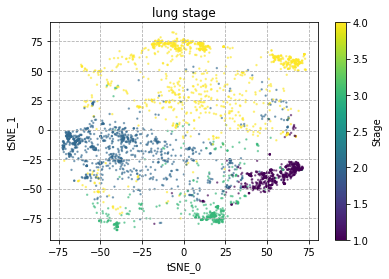

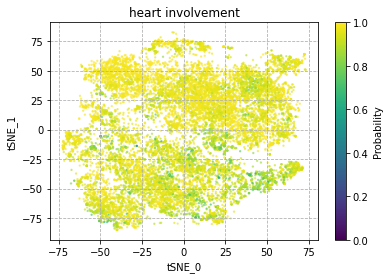

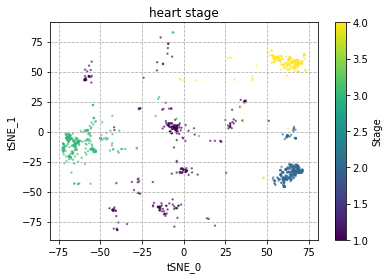

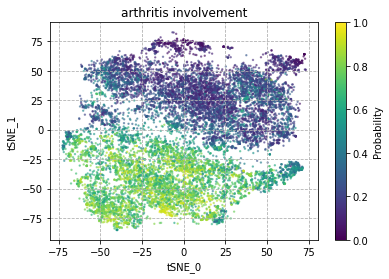

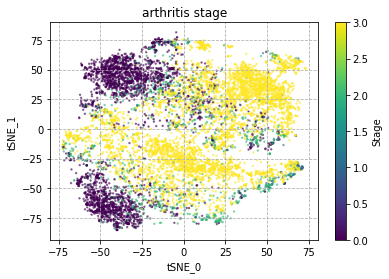

In [52]:
import matplotlib.cm as cm
titles = {0: 'lung involvement', 1: 'lung stage', 2: 'heart involvement', 3: 'heart stage', 4: "arthritis involvement", 5: "arthritis stage" }

for label_index, title in enumerate(titles.values()):
    fig, ax = plt.subplots()
    indices = list_of_arrays_recon[label_index].all(axis=1)

    if title in ["lung involvement", "heart involvement", "arthritis involvement"]:
        overlay_color = evaluation.res_list_y[label_index][1].detach()
        colorbar_vmin = 0
        colorbar_vmax = 1
        color = overlay_color[evaluation.indices_recon][indices]
        name_cbar = "Probability"
    else:
        overlay_color = evaluation.predicted_cats_y
        colorbar_vmin = np.nanmin(np.array(overlay_color[evaluation.indices_recon][indices, label_index]))
        colorbar_vmax = np.nanmax(np.array(overlay_color[evaluation.indices_recon][indices, label_index]))
        color = overlay_color[evaluation.indices_recon][indices, label_index]
        name_cbar = "Stage"

    #indices = list_of_arrays_recon[label_index].all(axis=1)
#     colorbar_vmin = np.nanmin(np.array(overlay_color[evaluation.indices_recon][indices, label_index]))
#     colorbar_vmax = np.nanmax(np.array(overlay_color[evaluation.indices_recon][indices, label_index]))
    scatter = ax.scatter(z_tsne_test[indices,0],z_tsne_test[indices,1], c = color, alpha = 0.5, vmin=colorbar_vmin, vmax=colorbar_vmax, s=2)

    #scatter = ax.scatter(z_tsne_test_lung[indices,0],z_tsne_test_lung[indices,1], c = overlay_color[indices_recon][indices, label_index], alpha = 0.5, vmin=colorbar_vmin, vmax=colorbar_vmax)
    #scatter = ax.scatter(z_tsne_test_heart[indices,0],z_tsne_test_heart[indices,1], c = overlay_color[indices_recon][indices, label_index], alpha = 0.5, vmin=colorbar_vmin, vmax=colorbar_vmax)
    #scatter = ax.scatter(z_tsne_test_arthritis[indices,0],z_tsne_test_arthritis[indices,1], c = overlay_color[indices_recon][indices, label_index], alpha = 0.5, vmin=colorbar_vmin, vmax=colorbar_vmax)
    plt.title(titles[label_index])
    
    # Create a ScalarMappable object for the colorbar
    sm = cm.ScalarMappable(cmap=scatter.get_cmap(), norm=plt.Normalize(vmin=colorbar_vmin, vmax=colorbar_vmax))
    sm.set_array([])  # Set an empty array to ensure correct color mapping

    # Add colorbar
    cbar = plt.colorbar(sm)
    cbar.ax.set_ylabel(name_cbar)
    ax.set_xlabel('tSNE_0')
    ax.set_ylabel('tSNE_1')
    ax.grid(linestyle = '--')

    plt.show()